In [23]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import GridSearchCV, KFold
from keras.wrappers.scikit_learn import KerasClassifier
from keras.optimizers import adam_v2
import seaborn as sns
import matplotlib.pyplot as plt

In [24]:
#read data
data = pd.read_csv('C:/Users/0004IW744/Desktop/Python/Assignments/16.Neural Networks/forestfires.csv')
data

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,...,0,0,0,0,0,0,0,0,0,large
513,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,...,0,0,0,0,0,0,0,0,0,large
514,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,...,0,0,0,0,0,0,0,0,0,large
515,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,...,0,0,0,0,0,0,0,0,0,small


In [3]:
#no null data as below
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 31 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   month          517 non-null    object 
 1   day            517 non-null    object 
 2   FFMC           517 non-null    float64
 3   DMC            517 non-null    float64
 4   DC             517 non-null    float64
 5   ISI            517 non-null    float64
 6   temp           517 non-null    float64
 7   RH             517 non-null    int64  
 8   wind           517 non-null    float64
 9   rain           517 non-null    float64
 10  area           517 non-null    float64
 11  dayfri         517 non-null    int64  
 12  daymon         517 non-null    int64  
 13  daysat         517 non-null    int64  
 14  daysun         517 non-null    int64  
 15  daythu         517 non-null    int64  
 16  daytue         517 non-null    int64  
 17  daywed         517 non-null    int64  
 18  monthapr  

In [4]:
#Descritive statistics
data.describe()

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthdec,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,...,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292,0.164410,...,0.017408,0.038685,0.003868,0.061896,0.032882,0.104449,0.003868,0.001934,0.029014,0.332689
std,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818,0.371006,...,0.130913,0.193029,0.062137,0.241199,0.178500,0.306138,0.062137,0.043980,0.168007,0.471632
min,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [26]:
#Copying to data1
data1 = data.copy()

In [5]:
data1.columns

Index(['month', 'day', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind',
       'rain', 'area', 'dayfri', 'daymon', 'daysat', 'daysun', 'daythu',
       'daytue', 'daywed', 'monthapr', 'monthaug', 'monthdec', 'monthfeb',
       'monthjan', 'monthjul', 'monthjun', 'monthmar', 'monthmay', 'monthnov',
       'monthoct', 'monthsep', 'size_category'],
      dtype='object')

In [27]:
data1 = data1.drop(['dayfri', 'daymon', 'daysat', 'daysun', 'daythu',
       'daytue', 'daywed', 'monthapr', 'monthaug', 'monthdec', 'monthfeb',
       'monthjan', 'monthjul', 'monthjun', 'monthmar', 'monthmay', 'monthnov',
       'monthoct', 'monthsep'], axis = 1)

In [28]:
data1

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00,small
...,...,...,...,...,...,...,...,...,...,...,...,...
512,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44,large
513,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29,large
514,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,large
515,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00,small


In [8]:
data1['month'].value_counts()

aug    184
sep    172
mar     54
jul     32
feb     20
jun     17
oct     15
apr      9
dec      9
may      2
jan      2
nov      1
Name: month, dtype: int64

In [29]:
data1['month'].replace(('jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec'),
                                        (1,2,3,4,5,6,7,8,9,10,11,12), inplace = True)
data1['day'].replace(('sun','mon','tue','wed','thu','fri','sat'), (1,2,3,4,5,6,7), inplace = True)
data1['size_category'].replace(('small','large'), (0,1), inplace = True)
data1

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
0,3,6,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00,0
1,10,3,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00,0
2,10,7,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00,0
3,3,6,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00,0
4,3,1,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...
512,8,1,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44,1
513,8,1,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29,1
514,8,1,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,1
515,8,7,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00,0


In [10]:
data1[data.duplicated()]

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
53,8,4,92.1,111.2,654.1,9.6,20.4,42,4.9,0.0,0.00,0
100,8,1,91.4,142.4,601.4,10.6,19.8,39,5.4,0.0,0.00,0
215,3,7,91.7,35.8,80.8,7.8,17.0,27,4.9,0.0,28.66,1
303,6,6,91.1,94.1,232.1,7.1,19.2,38,4.5,0.0,0.00,0
426,8,5,91.6,248.4,753.8,6.3,20.4,56,2.2,0.0,0.00,0
461,8,7,93.7,231.1,715.1,8.4,18.9,64,4.9,0.0,0.00,0
501,8,3,96.1,181.1,671.2,14.3,21.6,65,4.9,0.8,0.00,0
508,8,6,91.0,166.9,752.6,7.1,25.9,41,3.6,0.0,0.00,0


In [30]:
data1 = data1.drop(labels = [53,100,215,303,426,461,501,508], axis = 0).reset_index(drop = True)

In [31]:
data1[data1.duplicated()]

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category


In [13]:
data1

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
0,3,6,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00,0
1,10,3,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00,0
2,10,7,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00,0
3,3,6,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00,0
4,3,1,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00,0
...,...,...,...,...,...,...,...,...,...,...,...,...
504,8,1,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44,1
505,8,1,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29,1
506,8,1,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,1
507,8,7,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00,0


In [14]:
data1['size_category'].value_counts()

0    371
1    138
Name: size_category, dtype: int64

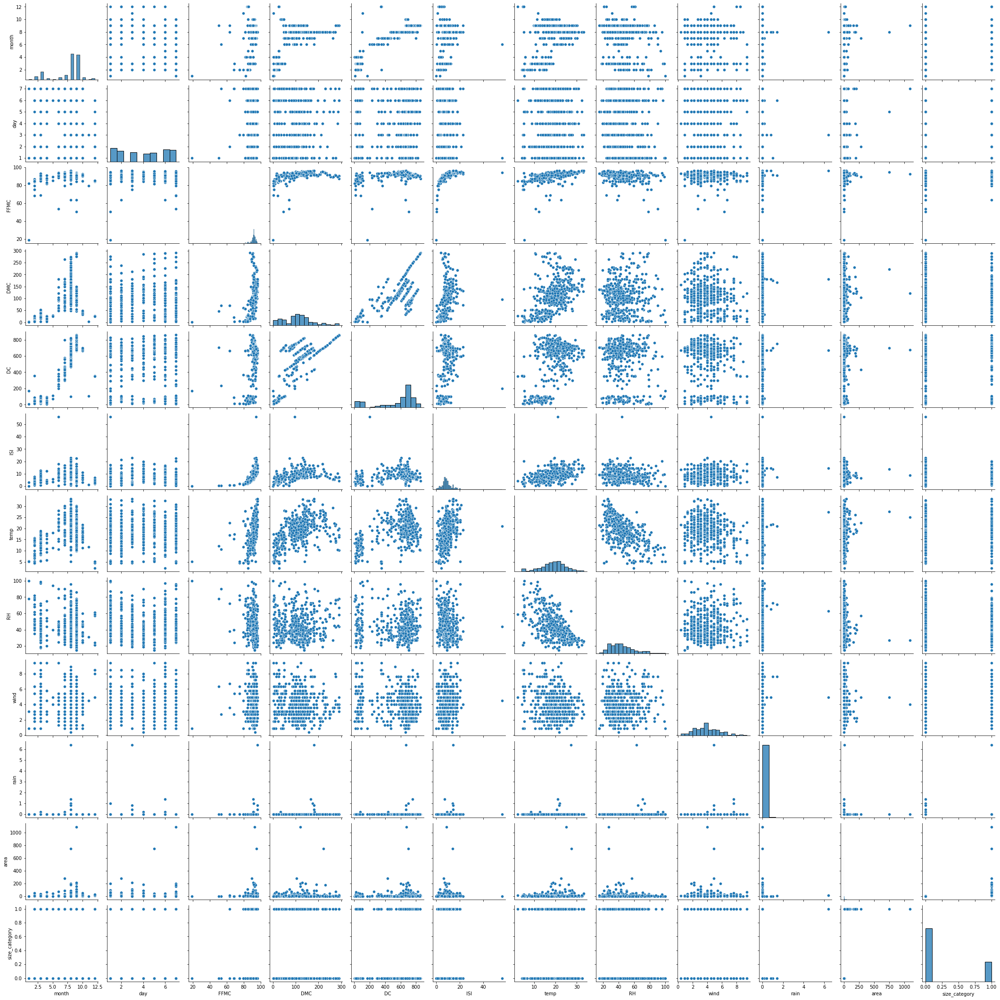

In [17]:
sns.pairplot(data1, kind="scatter")
plt.show()

In [18]:
data1.columns

Index(['month', 'day', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind',
       'rain', 'area', 'size_category'],
      dtype='object')

In [19]:
column = ['month', 'day', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'rain', 'area']

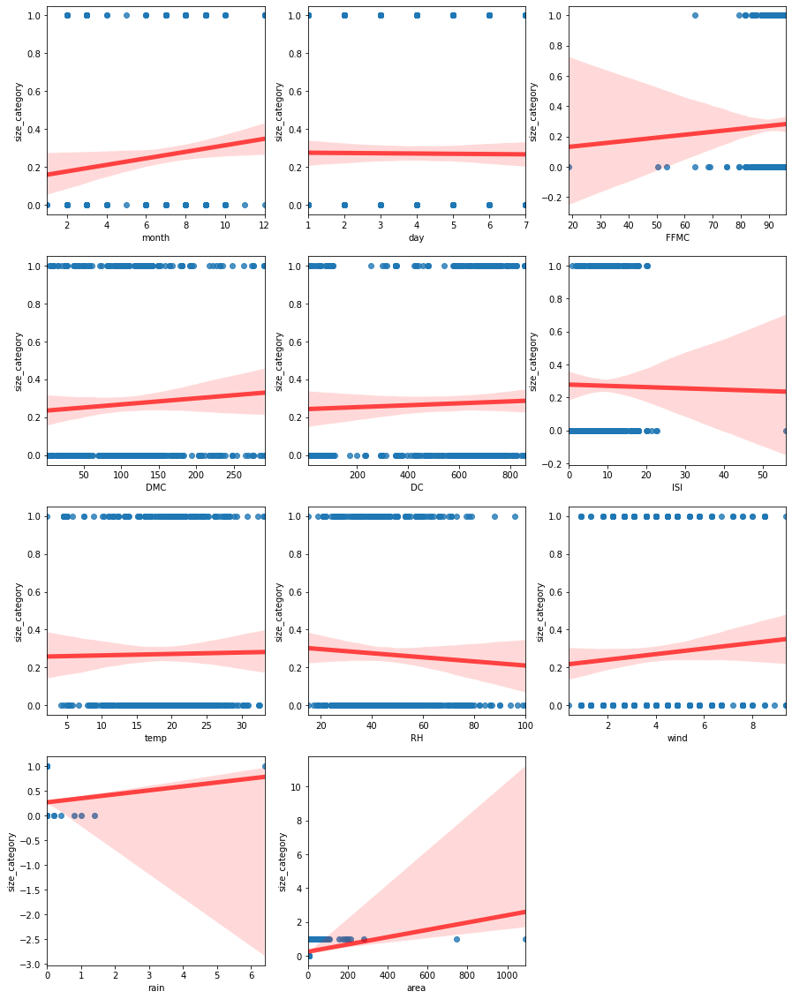

In [20]:
a = 1
plt.figure(figsize = (15, 20))
for i in column:
  plt.subplot(4,3,a)
  sns.regplot(x=data1[i], y=data1['size_category'], line_kws={"color":"r","alpha":0.7,"lw":5})
  a +=1

In [32]:
x = data1.iloc[:,:-1]
y = data1.iloc[:,-1]
print(x.head())
y.head()

   month  day  FFMC   DMC     DC  ISI  temp  RH  wind  rain  area
0      3    6  86.2  26.2   94.3  5.1   8.2  51   6.7   0.0   0.0
1     10    3  90.6  35.4  669.1  6.7  18.0  33   0.9   0.0   0.0
2     10    7  90.6  43.7  686.9  6.7  14.6  33   1.3   0.0   0.0
3      3    6  91.7  33.3   77.5  9.0   8.3  97   4.0   0.2   0.0
4      3    1  89.3  51.3  102.2  9.6  11.4  99   1.8   0.0   0.0


0    0
1    0
2    0
3    0
4    0
Name: size_category, dtype: int64

In [33]:
#Standardisation
scaler = StandardScaler()
scaler.fit(x)
x1 = scaler.fit_transform(x)
x_std = pd.DataFrame(x1,columns=data1.columns[:-1])
x_std.head()

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,-1.964353,0.953221,-0.796040,-1.318386,-1.828931,-0.856568,-1.827729,0.412656,1.494370,-0.069035,-0.202791
1,1.104033,-0.447711,-0.003257,-1.174053,0.489257,-0.507267,-0.148307,-0.688321,-1.729364,-0.069035,-0.202791
2,1.104033,1.420199,-0.003257,-1.043839,0.561045,-0.507267,-0.730964,-0.688321,-1.507037,-0.069035,-0.202791
3,-1.964353,0.953221,0.194939,-1.206998,-1.896686,-0.005147,-1.810592,3.226265,-0.006333,0.606709,-0.202791
4,-1.964353,-1.381666,-0.237488,-0.924607,-1.797070,0.125841,-1.279346,3.348596,-1.229129,-0.069035,-0.202791


In [34]:
x_train, x_test, y_train, y_test = train_test_split(x_std, y, test_size=0.25, random_state=40)
print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(381, 11) (128, 11) (381,) (128,)


### Neural Network Model - Tuning of Hyperparameters for batch size and epochs

In [35]:
def create_model():
    model = Sequential()
    model.add(Dense(12, input_dim = 11, kernel_initializer = 'uniform', activation = 'relu'))
    model.add(Dense(8, kernel_initializer = 'uniform', activation = 'relu'))
    model.add(Dense(1, kernel_initializer = 'uniform', activation = 'sigmoid'))
    adam = adam_v2.Adam(learning_rate = 0.01)
    model.compile(loss = 'binary_crossentropy', optimizer = adam, metrics = ['accuracy'])
    return model

In [36]:
model = KerasClassifier(build_fn = create_model,verbose = 0)
batch_size = [10,20,40]
epochs = [10,50,100]
param_grid = dict(batch_size = batch_size,epochs = epochs)
grid = GridSearchCV(estimator = model,param_grid = param_grid,cv = KFold(),verbose = 10)
grid_result = grid.fit(x_train, y_train)

<ipython-input-36-6694cb8a2045>:1: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead.
  model = KerasClassifier(build_fn = create_model,verbose = 0)


Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5; 1/9] START batch_size=10, epochs=10....................................
[CV 1/5; 1/9] END ..................batch_size=10, epochs=10; total time=   1.4s
[CV 2/5; 1/9] START batch_size=10, epochs=10....................................
[CV 2/5; 1/9] END ..................batch_size=10, epochs=10; total time=   0.8s
[CV 3/5; 1/9] START batch_size=10, epochs=10....................................
[CV 3/5; 1/9] END ..................batch_size=10, epochs=10; total time=   0.7s
[CV 4/5; 1/9] START batch_size=10, epochs=10....................................
[CV 4/5; 1/9] END ..................batch_size=10, epochs=10; total time=   0.7s
[CV 5/5; 1/9] START batch_size=10, epochs=10....................................
[CV 5/5; 1/9] END ..................batch_size=10, epochs=10; total time=   0.6s
[CV 1/5; 2/9] START batch_size=10, epochs=50....................................
[CV 1/5; 2/9] END ..................batch_size=10

In [70]:
print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
  print('{},{} with: {}'.format(mean, stdev, param))

Best : 0.9685577511787414, using {'batch_size': 20, 'epochs': 50}
0.9527682662010193,0.017809968236535984 with: {'batch_size': 10, 'epochs': 10}
0.9632604122161865,0.021040809085447993 with: {'batch_size': 10, 'epochs': 50}
0.9632945895195008,0.019228070154648554 with: {'batch_size': 10, 'epochs': 100}
0.9212918758392334,0.04396579272831496 with: {'batch_size': 20, 'epochs': 10}
0.9685577511787414,0.019548152343475057 with: {'batch_size': 20, 'epochs': 50}
0.9396445512771606,0.03177102873537798 with: {'batch_size': 20, 'epochs': 100}
0.7454545378684998,0.07358704704181519 with: {'batch_size': 40, 'epochs': 10}
0.9554340481758118,0.022786784489836204 with: {'batch_size': 40, 'epochs': 50}
0.9527682781219482,0.021347112055270113 with: {'batch_size': 40, 'epochs': 100}


### Neural Network Model - Tuning of Hyperparameters for all

In [88]:
def create_model(learning_rate,dropout_rate,activation_function,init,neuron1,neuron2):
    model = Sequential()
    model.add(Dense(neuron1,input_dim = 11,kernel_initializer = init,activation = activation_function))
    model.add(Dropout(dropout_rate))
    model.add(Dense(neuron2,input_dim = neuron1,kernel_initializer = init,activation = activation_function))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1,activation = 'sigmoid'))
    
    adam=adam_v2.Adam(learning_rate = learning_rate)
    model.compile(loss = 'binary_crossentropy',optimizer = adam,metrics = ['accuracy'])
    return model

In [89]:
model = KerasClassifier(build_fn = create_model,verbose = 0)

batch_size = [10,20,40]
epochs = [10,50,100]
learning_rate = [0.001,0.01,0.1]
dropout_rate = [0.0,0.1,0.2]
activation_function = ['softmax','relu','tanh','linear']
init = ['uniform','normal','zero']
neuron1 = [4,8,16]
neuron2 = [2,4,8]

param_grids = dict(batch_size = batch_size,epochs = epochs,learning_rate = learning_rate,dropout_rate = dropout_rate,
                   activation_function = activation_function,init = init,neuron1 = neuron1,neuron2 = neuron2)


grid = GridSearchCV(estimator = model,param_grid = param_grids,cv = KFold(),verbose = 10)
grid_result = grid.fit(x_train, y_train)

print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
  print('{},{} with: {}'.format(mean, stdev, param))

<ipython-input-89-1aaa2bf709af>:1: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead.
  model = KerasClassifier(build_fn = create_model,verbose = 0)


Fitting 5 folds for each of 8748 candidates, totalling 43740 fits
[CV 1/5; 1/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 1/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2; total time=   0.9s
[CV 2/5; 1/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 1/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2; total time=   1.0s
[CV 3/5; 1/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 1/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4

In [90]:
print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))

Best : 0.9869104504585267, using {'activation_function': 'tanh', 'batch_size': 40, 'dropout_rate': 0.1, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.1, 'neuron1': 4, 'neuron2': 4}


### Final Nueral Network model 

In [91]:
final_model = Sequential()
final_model.add(Dense(4,input_dim = 11,kernel_initializer = 'uniform',activation = 'tanh'))
final_model.add(Dropout(0.1))
final_model.add(Dense(4,input_dim = 4,kernel_initializer = 'uniform',activation = 'tanh'))
final_model.add(Dropout(0.1))
final_model.add(Dense(1,activation = 'sigmoid'))
    
adam=adam_v2.Adam(learning_rate = 0.1)

In [92]:
final_model.compile(loss = 'binary_crossentropy',optimizer = adam,metrics = ['accuracy'])
final_model.fit(x_train,y_train, epochs=100, batch_size=40)

Epoch 1/100
10/10 [==============================] - 0s 2ms/step - loss: 0.6094 - accuracy: 0.6929
Epoch 2/100
10/10 [==============================] - 0s 2ms/step - loss: 0.5260 - accuracy: 0.7717
Epoch 3/100
10/10 [==============================] - 0s 2ms/step - loss: 0.4175 - accuracy: 0.8425
Epoch 4/100
10/10 [==============================] - 0s 2ms/step - loss: 0.3124 - accuracy: 0.8714
Epoch 5/100
10/10 [==============================] - 0s 2ms/step - loss: 0.3002 - accuracy: 0.8688
Epoch 6/100
10/10 [==============================] - 0s 2ms/step - loss: 0.2338 - accuracy: 0.9134
Epoch 7/100
10/10 [==============================] - 0s 2ms/step - loss: 0.1797 - accuracy: 0.9344
Epoch 8/100
10/10 [==============================] - 0s 2ms/step - loss: 0.1191 - accuracy: 0.9606
Epoch 9/100
10/10 [==============================] - 0s 2ms/step - loss: 0.2995 - accuracy: 0.9029
Epoch 10/100
10/10 [==============================] - 0s 2ms/step - loss: 0.3862 - accuracy: 0.8583
Epoch 11/

In [96]:
scores = final_model.evaluate(x_test, y_test)
print('accuracy: ', scores[1]*100)

4/4 [==============================] - 0s 2ms/step - loss: 0.0482 - accuracy: 0.9844
accuracy:  98.4375


# final model with best perameters and i got 98% accuracy.